In [1]:
# import ParentImport
import datasets
import torchvision.transforms as transforms
import face_recognition
import pandas as pd
import numpy as np
import ipyplot
import torch

from tqdm.auto import tqdm
from matplotlib.pyplot import imshow
# from trainer import Trainer

import matplotlib.pyplot as plt
import json

In [2]:
dataset = datasets.Dataset(basedir='datasets')
print(dataset.is_fake('9a22372d22a52397.mp4'))
dataset.all_videos

TRAIN SIZE 6248
TEXT SIZE 695
1


0       9a22372d22a52397.mp4
1       9bc4f1306bb8e2cd.mp4
2       88fe2a902a9d8cc7.mp4
3       1f3cbda142d0944a.mp4
4       63bed62257daccaf.mp4
                ...         
6938    f5c4bfb20068f129.mp4
6939    b7b7b7f6db7f6e2e.mp4
6940    c3fc75289ae3b41e.mp4
6941    519e97d4c90aaa1c.mp4
6942    38cd7b295a5cfda5.mp4
Name: filename, Length: 6943, dtype: object

In [3]:
face_map_stats = json.loads(open('./face_map_stats-4-20.json').read())
print(len(face_map_stats))
print(face_map_stats)

10
{'9a22372d22a52397.mp4': [2, 1.0], '9bc4f1306bb8e2cd.mp4': [1, 1.0], '88fe2a902a9d8cc7.mp4': [2, 1.0], '1f3cbda142d0944a.mp4': [1, 1.0], '63bed62257daccaf.mp4': [1, 1.0], 'ee8e8d4a59a95d5f.mp4': [1, 1.0], '04011d0f6efa6d85.mp4': [1, 1.0], 'cbcf9320b4e4d9f9.mp4': [1, 1.0], '262a25215787616d.mp4': [1, 1.0], 'fbca2df503111454.mp4': [1, 1.0]}


In [4]:
statuses = []
face_metrics = []
vid_labels = []
names = list(face_map_stats.keys())

for vid_name in tqdm(names):
    vid_stats = face_map_stats[vid_name]
    has_face = vid_stats[1]
    face_metrics.append(has_face)
    is_fake = dataset.is_fake(vid_name)
    vid_labels.append(is_fake)
    
    if is_fake:
        if has_face == 0:
            # is fake, face not detected
            statuses.append('F+')
        else:
            # is fake, face detected
            statuses.append('FU')
    else:
        if has_face == 0:
            # not fake, no face detected
            statuses.append('R-')
        else:
            # not fake, face detected
            statuses.append('RU')
    
for status in set(statuses):
    count = statuses.count(status)
    percentage = round(100 * count / len(statuses), 2)
    print(status, count, percentage)
    
statuses = np.array(statuses)
face_metrics = np.array(face_metrics)
vid_labels = np.array(vid_labels)
names = np.array(names)

  0%|          | 0/10 [00:00<?, ?it/s]

FU 10 100.0


In [5]:
failed_real_videos = names[np.where(statuses == 'R-')]
failed_fake_videos = names[np.where(statuses == 'F+')]
print(len(failed_real_videos), failed_real_videos)
print(len(failed_fake_videos), failed_fake_videos)

0 []
0 []


In [6]:
"""
every_n_frames = 20
vidobj = dataset.get_face_locations(
    '86fb36004cbb9227.mp4', rescale=1,
    every_n_frames=every_n_frames
)

print(vidobj.video_faces)
video_faces = vidobj.video_faces
frame_index = list(video_faces.keys())[0]
loc1 = video_faces[frame_index][0]
image = vidobj.out_video[frame_index // every_n_frames]
top, right, bottom, left = loc1
crop_image = image[top:bottom, left:right]
    
%matplotlib inline
imshow(crop_image)
"""

"\nevery_n_frames = 20\nvidobj = dataset.get_face_locations(\n    '86fb36004cbb9227.mp4', rescale=1,\n    every_n_frames=every_n_frames\n)\n\nprint(vidobj.video_faces)\nvideo_faces = vidobj.video_faces\nframe_index = list(video_faces.keys())[0]\nloc1 = video_faces[frame_index][0]\nimage = vidobj.out_video[frame_index // every_n_frames]\ntop, right, bottom, left = loc1\ncrop_image = image[top:bottom, left:right]\n    \n%matplotlib inline\nimshow(crop_image)\n"

In [7]:
every_n_frames = 20
all_failed_videos = """
86fb36004cbb9227.mp4
fcba83aed209eb27.mp4
c10d8ed5abfd1eab.mp4
60e38a133f7c619c.mp4
e416b3215ebf823c.mp4
7cefa46323893b8c.mp4
e7c1248f1566506d.mp4
13f9093ff81a3fb7.mp4
23b70adaff750216.mp4
b7c0cbb0fa0dd1eb.mp4
19d81e9aad1dab6b.mp4
b52113b4702e6fbe.mp4
80a8c02a5a99f8f9.mp4
637add700674c976.mp4
3d9643987cdc139c.mp4
4d1c4b1e7f86f6bf.mp4
318b4e0b4db37132.mp4
231cd47c1ed53535.mp4
c6e5d2e44c4d9e19.mp4
f970753c9348d6d9.mp4
652c274b7e5f098d.mp4
466120c9ca99b722.mp4
d27c1c217aae3e70.mp4
18be5a88d3b7fb4e.mp4
2dadd883c06ea06f.mp4
ee4895d55e2cbb67.mp4
b2c90c071c0a924a.mp4
85e6445fdaa8eff9.mp4
""".strip().split()

sucessful = 0
failed = 0
print(len(all_failed_videos), all_failed_videos)

for filename in all_failed_videos:
    vidobj = dataset.get_face_locations(
        filename, rescale=0.5, every_n_frames=every_n_frames
    )
    
    num_faces_detected = len(vidobj.video_faces)
    print(f'{filename} faces {num_faces_detected}')
    
    if num_faces_detected > 0:
        sucessful += 1
    else:
        failed += 1
    
print(f'SUCESSFUL {sucessful} FAILED {failed}')

28 ['86fb36004cbb9227.mp4', 'fcba83aed209eb27.mp4', 'c10d8ed5abfd1eab.mp4', '60e38a133f7c619c.mp4', 'e416b3215ebf823c.mp4', '7cefa46323893b8c.mp4', 'e7c1248f1566506d.mp4', '13f9093ff81a3fb7.mp4', '23b70adaff750216.mp4', 'b7c0cbb0fa0dd1eb.mp4', '19d81e9aad1dab6b.mp4', 'b52113b4702e6fbe.mp4', '80a8c02a5a99f8f9.mp4', '637add700674c976.mp4', '3d9643987cdc139c.mp4', '4d1c4b1e7f86f6bf.mp4', '318b4e0b4db37132.mp4', '231cd47c1ed53535.mp4', 'c6e5d2e44c4d9e19.mp4', 'f970753c9348d6d9.mp4', '652c274b7e5f098d.mp4', '466120c9ca99b722.mp4', 'd27c1c217aae3e70.mp4', '18be5a88d3b7fb4e.mp4', '2dadd883c06ea06f.mp4', 'ee4895d55e2cbb67.mp4', 'b2c90c071c0a924a.mp4', '85e6445fdaa8eff9.mp4']
86fb36004cbb9227.mp4 faces 0
fcba83aed209eb27.mp4 faces 0
c10d8ed5abfd1eab.mp4 faces 0
60e38a133f7c619c.mp4 faces 0
e416b3215ebf823c.mp4 faces 1
7cefa46323893b8c.mp4 faces 0
e7c1248f1566506d.mp4 faces 1
13f9093ff81a3fb7.mp4 faces 2
23b70adaff750216.mp4 faces 12
b7c0cbb0fa0dd1eb.mp4 faces 15
19d81e9aad1dab6b.mp4 faces 1
b52

In [8]:
"""
86fb36004cbb9227.mp4 faces 1
fcba83aed209eb27.mp4 faces 1
c10d8ed5abfd1eab.mp4 faces 1
60e38a133f7c619c.mp4 faces 2
e416b3215ebf823c.mp4 faces 4
7cefa46323893b8c.mp4 faces 0
e7c1248f1566506d.mp4 faces 0
13f9093ff81a3fb7.mp4 faces 5
23b70adaff750216.mp4 faces 16
b7c0cbb0fa0dd1eb.mp4 faces 16
19d81e9aad1dab6b.mp4 faces 2
b52113b4702e6fbe.mp4 faces 0
80a8c02a5a99f8f9.mp4 faces 1
637add700674c976.mp4 faces 2
3d9643987cdc139c.mp4 faces 0
4d1c4b1e7f86f6bf.mp4 faces 0
318b4e0b4db37132.mp4 faces 0
231cd47c1ed53535.mp4 faces 0
c6e5d2e44c4d9e19.mp4 faces 0
f970753c9348d6d9.mp4 faces 0
652c274b7e5f098d.mp4 faces 0
466120c9ca99b722.mp4 faces 0
d27c1c217aae3e70.mp4 faces 0
18be5a88d3b7fb4e.mp4 faces 0
2dadd883c06ea06f.mp4 faces 15
ee4895d55e2cbb67.mp4 faces 16
b2c90c071c0a924a.mp4 faces 28
85e6445fdaa8eff9.mp4 faces 6
"""

'\n86fb36004cbb9227.mp4 faces 1\nfcba83aed209eb27.mp4 faces 1\nc10d8ed5abfd1eab.mp4 faces 1\n60e38a133f7c619c.mp4 faces 2\ne416b3215ebf823c.mp4 faces 4\n7cefa46323893b8c.mp4 faces 0\ne7c1248f1566506d.mp4 faces 0\n13f9093ff81a3fb7.mp4 faces 5\n23b70adaff750216.mp4 faces 16\nb7c0cbb0fa0dd1eb.mp4 faces 16\n19d81e9aad1dab6b.mp4 faces 2\nb52113b4702e6fbe.mp4 faces 0\n80a8c02a5a99f8f9.mp4 faces 1\n637add700674c976.mp4 faces 2\n3d9643987cdc139c.mp4 faces 0\n4d1c4b1e7f86f6bf.mp4 faces 0\n318b4e0b4db37132.mp4 faces 0\n231cd47c1ed53535.mp4 faces 0\nc6e5d2e44c4d9e19.mp4 faces 0\nf970753c9348d6d9.mp4 faces 0\n652c274b7e5f098d.mp4 faces 0\n466120c9ca99b722.mp4 faces 0\nd27c1c217aae3e70.mp4 faces 0\n18be5a88d3b7fb4e.mp4 faces 0\n2dadd883c06ea06f.mp4 faces 15\nee4895d55e2cbb67.mp4 faces 16\nb2c90c071c0a924a.mp4 faces 28\n85e6445fdaa8eff9.mp4 faces 6\n'

In [9]:
"""
ultrasharp videos
dabac5f072e1226f

blur videos
681fc525a206f128 
3e8ebb54d3ea5f5e

horizontal distorted videos
183e7aa54ff16150
e7c1248f1566506d
b57a96e8a6eb5db7

vertical distorted videos
4d1c4b1e7f86f6bf

normal videos
d30576149a1c89f2

square pixel blurred videos
3f6f42b96c3b0252 
6b7b072580418f47
4614973dd3795b6a
"""
# failed_real_videos

'\nultrasharp videos\ndabac5f072e1226f\n\nblur videos\n681fc525a206f128 \n3e8ebb54d3ea5f5e\n\nhorizontal distorted videos\n183e7aa54ff16150\ne7c1248f1566506d\nb57a96e8a6eb5db7\n\nvertical distorted videos\n4d1c4b1e7f86f6bf\n\nnormal videos\nd30576149a1c89f2\n\nsquare pixel blurred videos\n3f6f42b96c3b0252 \n6b7b072580418f47\n4614973dd3795b6a\n'

In [10]:
every_n_frames = 40
vidobj = dataset.get_face_locations(
    '4d1c4b1e7f86f6bf.mp4', rescale=1,
    every_n_frames=every_n_frames
)

fig = plt.figure()
video_faces = vidobj.video_faces

if len(video_faces) != 0:
    # fig.add_subplot(2, 2, 1)
    frame_index = list(video_faces.keys())[5]
    loc1 = video_faces[frame_index][0]
    image = vidobj.out_video[frame_index // every_n_frames]

    top, right, bottom, left = loc1
    # print(image)
    crop_image = image[top:bottom, left:right]
    print(crop_image.shape)
    # plt.figure()
    # %matplotlib inline
    %matplotlib inline
    imshow(crop_image)

<Figure size 432x288 with 0 Axes>

In [11]:
a = np.array([[1,2,3], [4,5,6], [7,8,9]])
print(a[:, 2])

[3 6 9]



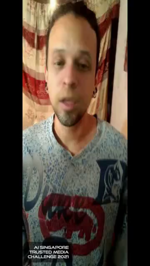
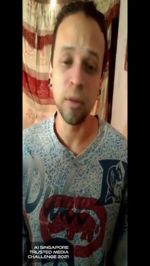
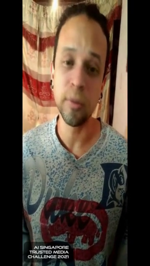
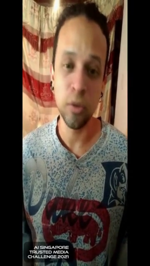
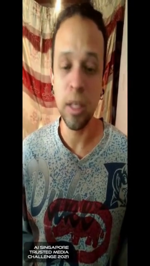
...
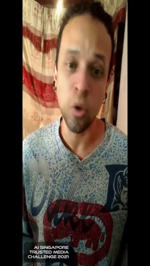
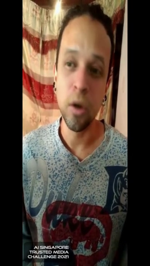
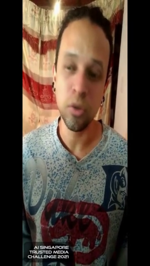
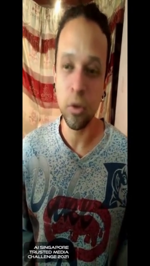
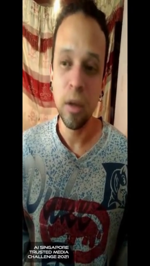

In [12]:
# print(video_faces)
# face_images = vidobj.get_face_images(video_faces, every_n_frames)
ipyplot.plot_images(vidobj.out_video)

In [13]:
resized_frames = vidobj.auto_resize()
print(resized_frames)
dataset.get_face_locations(
    resized_frames, rescale=resized_frames.rescale,
    every_n_frames=resized_frames.frames
)

INTERVAL 0 (38, 1920, 1080, 3)
COORDS (158, 931, 0, 1919)
VideoArray(name='4d1c4b1e7f86f6bf.mp4', width=1080, height=1920)


VideoArray(name='4d1c4b1e7f86f6bf.mp4', width=1080, height=1920)


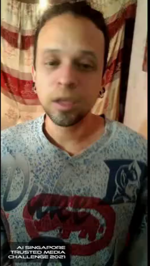
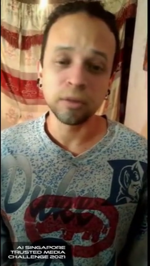
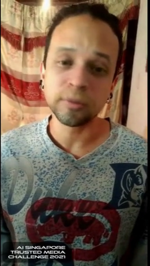
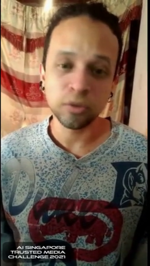
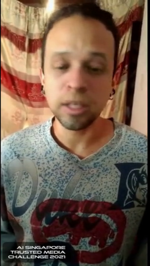
...
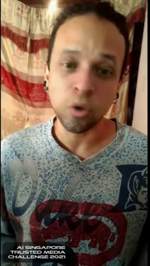
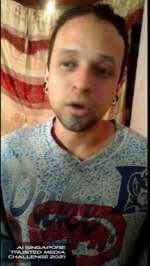
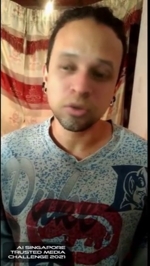
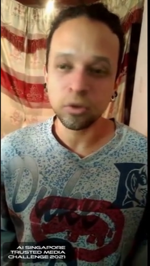
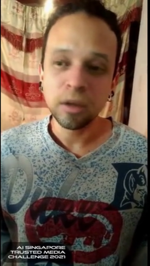

In [14]:
ipyplot.plot_images(resized_frames.out_video)

In [15]:
# print(video_faces)
face_images = resized_frames.get_face_images(video_faces, every_n_frames)
print(face_images)
ipyplot.plot_images(face_images)

[]


IndexError: list index out of range